# Noise Reduction

This notebook shows the exmaple of a simple noise reduction based on spectral substraction.<br>
&ensp;

In [3]:
### Import packages
from pathlib import Path
import numpy as np
import scipy.io.wavfile as wavfile
import matplotlib.pyplot as plt
import IPython.display as ipd
import librosa
import librosa.display
plt.rcParams['figure.figsize'] = [16, 12]
plt.rcParams.update({'font.size': 18})

In [7]:
# Import speech in noise recording
this_path = Path.cwd().parent
data_path = this_path / 'data'

files_wav = list(data_path.glob('**/*.wav'))

print(f"Files in folder {data_path}:\n------")
for idx, val in enumerate(files_wav):
    print("{:<3}{:}".format(idx, val.name))

Files in folder C:\Users\klein\Documents\1_Code\simsalabim\data:
------
0  Nachrichten+0,2WhiteNoise_48k_SK.wav


&ensp;
## 1. Listening and general information
* Load a single file, print its information and create the audio player
* The use of __[librosa.load](https://librosa.org/doc/main/core.html#audio-loading)__ is prefered to __[scipy.io.wavfile.read](https://docs.scipy.org/doc/scipy/reference/io.html#module-scipy.io.wavfile)__, beacause the latter does not support all variants of the wav format. For example,  24 -bit integer WAV-files are not allowed. Furthermore, certain metadata fields in a wav file may also lead to errors. See __[here](https://www.audiolabs-erlangen.de/resources/MIR/FMP/B/B_PythonAudio.html#SciPy)__.

In [19]:
# Handling single file e.g. for listening/plotting
duration = 10
test_file = files_wav[0]
test_data, sampling_rate = librosa.load(test_file, sr=22050, duration=duration)
ipd.Audio(test_file)

&ensp;
## 2. Noise Reduction algorithm

In [15]:
# perform algorithm

&ensp;
## 3. Plots
...

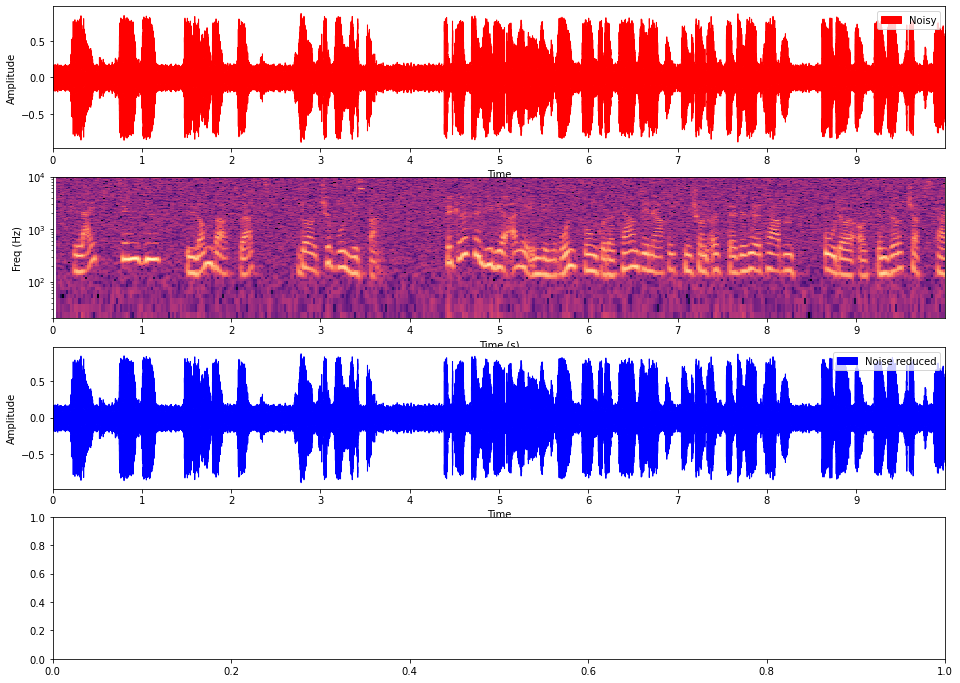

In [38]:
sr = sampling_rate
x = test_data
x_nr = x
dt = 1 / sr
t = np.arange(0, duration, dt)
freqLimits = (20, 10000)

n_fft = 2048
hop_length = 512

# compute stft
X = librosa.stft(x)
Xdb = librosa.amplitude_to_db(abs(X))

# get frequency bins
freq = np.fft.rfftfreq(n=n_fft, d=1.0 / sr)

# frames to samples to time 
# (maybe start with samples from x instead Xdb)
frames = np.arange(Xdb.shape[1])
offset = int(n_fft // 2)
samples = (np.asanyarray(frames) * hop_length + offset).astype(int)
times = np.asanyarray(samples) / float(sr)

## Plots
%matplotlib inline
fig, axs = plt.subplots(nrows=4, ncols=1, figsize=(16,12))

# noisy
librosa.display.waveshow(x, sr=sr, ax=axs[0], color='r', label='Noisy')
axs[0].set_xlim(t[0], t[-1])
axs[0].set_ylabel('Amplitude')
axs[0].legend()

# spectogram
plt.sca(axs[1])
plt.pcolormesh(times, freq, Xdb, cmap='magma')
#fig.subplots_adjust(right=0.95)
#cax = fig.add_axes([0.975, 0.15, 0.02, 0.7])
#plt.colorbar(cax=cax)
axs[1].sharex(axs[0])
axs[1].set_ylabel('Freq (Hz)')
axs[1].set_xlabel('Time (s)')
axs[1].set_ylim(freqLimits)
axs[1].set_yscale('log')


librosa.display.waveshow(x_nr, sr=sr, ax=axs[2], color='b', label='Noise reduced')
axs[2].set_xlim(t[0], t[-1])
axs[2].set_ylabel('Amplitude')
axs[2].legend()
#plt.sca(axs[2])
# plt.plot(t,f_clean,color='k', lw=1.5,label='Clean')
#plt.plot(t,ffilt,color='b', lw=2,label='Filtered')
#plt.xlabel('Time (s)')
#plt.xlim(t[0],t[-1])
#plt.ylabel('Magnitude')
#plt.legend()

#plt.sca(axs[3])
#plt.plot(freq[L],PSD[L],color='r', lw=2,label='Noisy')
#plt.plot(freq[L],PSDclean[L],color='b', lw=1.5, label='Filtered')
#plt.xscale('log')
#axs[3].grid('on', which='minor', axis='x', linestyle='--')
#axs[3].grid('on', which='major', axis='both', linestyle='--')
#plt.xlabel('Freq (Hz)')
#plt.ylabel('Magnitude')
#plt.xlim(100, 12000)
#plt.legend()

plt.show()